# Регрессия на доходность за три месяца

### Импорты

In [1]:
import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

from scipy.stats import spearmanr, pearsonr, kendalltau

import warnings
warnings.filterwarnings("ignore")

### Датафрейм

In [2]:
path = '../../../data/final/pairs.csv'

data = pd.read_csv(path, index_col = 0)
data.head(3)

,views,forwards,thumb_up_react_cnt,thumb_down_react_cnt,mindblowing_react_cnt,heart_react_cnt,thinking_react_cnt,crying_react_cnt,fire_react_cnt,clap_react_cnt,...,free_bird_react_cnt_x_positive_div_by_days,snowman_react_cnt_x_positive_div_by_days,banana_react_cnt_x_positive_div_by_days,poop_react_cnt_x_positive_div_by_days,rofl_smile_react_cnt_x_positive_div_by_days,clown_smile_react_cnt_x_positive_div_by_days,devil_smile_react_cnt_x_positive_div_by_days,hundred_react_cnt_x_positive_div_by_days,head_arm_smile_react_cnt_x_positive_div_by_days,eyes_react_cnt_x_positive_div_by_days
0,63078,63,251,19,0,27,36,0,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,63078,63,251,19,0,27,36,0,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,63078,63,251,19,0,27,36,0,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
cols = ['views',
 'forwards',
 'thumb_up_react_cnt',
 'thumb_down_react_cnt',
 'mindblowing_react_cnt',
 'heart_react_cnt',
 'thinking_react_cnt',
 'crying_react_cnt',
 'fire_react_cnt',
 'clap_react_cnt',
 'whale_react_cnt',
 'champaign_react_cnt',
 'heart_fire_react_cnt',
 'okay_react_cnt',
 'smile_stars_react_cnt',
 'smiling_react_cnt',
 'cheers_react_cnt',
 'lovely_smile_react_cnt',
 'drunk_smile_react_cnt',
 'angry_smile_react_cnt',
 'shicked_smile_react_cnt',
 'moos_smile_react_cnt',
 'hotdog_react_cnt',
 'free_bird_react_cnt',
 'snowman_react_cnt',
 'banana_react_cnt',
 'poop_react_cnt',
 'rofl_smile_react_cnt',
 'clown_smile_react_cnt',
 'devil_smile_react_cnt',
 'hundred_react_cnt',
 'head_arm_smile_react_cnt',
 'eyes_react_cnt',
 'days_before_ipo',
 'text_len',
 'price',
 'delta_price',
 'delta_perc',
 'open',
 'delta_open',
 'delta_perc_on_ipo_date',
 'positive_score',
 'views_x_positive',
 'forwards_x_positive',
 'thumb_up_react_cnt_x_positive',
 'thumb_down_react_cnt_x_positive',
 'mindblowing_react_cnt_x_positive',
 'heart_react_cnt_x_positive',
 'thinking_react_cnt_x_positive',
 'crying_react_cnt_x_positive',
 'fire_react_cnt_x_positive',
 'clap_react_cnt_x_positive',
 'whale_react_cnt_x_positive',
 'champaign_react_cnt_x_positive',
 'heart_fire_react_cnt_x_positive',
 'okay_react_cnt_x_positive',
 'smile_stars_react_cnt_x_positive',
 'smiling_react_cnt_x_positive',
 'cheers_react_cnt_x_positive',
 'lovely_smile_react_cnt_x_positive',
 'drunk_smile_react_cnt_x_positive',
 'angry_smile_react_cnt_x_positive',
 'shicked_smile_react_cnt_x_positive',
 'moos_smile_react_cnt_x_positive',
 'hotdog_react_cnt_x_positive',
 'free_bird_react_cnt_x_positive',
 'snowman_react_cnt_x_positive',
 'banana_react_cnt_x_positive',
 'poop_react_cnt_x_positive',
 'rofl_smile_react_cnt_x_positive',
 'clown_smile_react_cnt_x_positive',
 'devil_smile_react_cnt_x_positive',
 'hundred_react_cnt_x_positive',
 'head_arm_smile_react_cnt_x_positive',
 'eyes_react_cnt_x_positive',
 'views_div_by_days',
 'forwards_div_by_days',
 'thumb_up_react_cnt_div_by_days',
 'thumb_down_react_cnt_div_by_days',
 'mindblowing_react_cnt_div_by_days',
 'heart_react_cnt_div_by_days',
 'thinking_react_cnt_div_by_days',
 'crying_react_cnt_div_by_days',
 'fire_react_cnt_div_by_days',
 'clap_react_cnt_div_by_days',
 'whale_react_cnt_div_by_days',
 'champaign_react_cnt_div_by_days',
 'heart_fire_react_cnt_div_by_days',
 'okay_react_cnt_div_by_days',
 'smile_stars_react_cnt_div_by_days',
 'smiling_react_cnt_div_by_days',
 'cheers_react_cnt_div_by_days',
 'lovely_smile_react_cnt_div_by_days',
 'drunk_smile_react_cnt_div_by_days',
 'angry_smile_react_cnt_div_by_days',
 'shicked_smile_react_cnt_div_by_days',
 'moos_smile_react_cnt_div_by_days',
 'hotdog_react_cnt_div_by_days',
 'free_bird_react_cnt_div_by_days',
 'snowman_react_cnt_div_by_days',
 'banana_react_cnt_div_by_days',
 'poop_react_cnt_div_by_days',
 'rofl_smile_react_cnt_div_by_days',
 'clown_smile_react_cnt_div_by_days',
 'devil_smile_react_cnt_div_by_days',
 'hundred_react_cnt_div_by_days',
 'head_arm_smile_react_cnt_div_by_days',
 'eyes_react_cnt_div_by_days',
 'text_len_div_by_days',
 'positive_score_div_by_days',
 'views_x_positive_div_by_days',
 'forwards_x_positive_div_by_days',
 'thumb_up_react_cnt_x_positive_div_by_days',
 'thumb_down_react_cnt_x_positive_div_by_days',
 'mindblowing_react_cnt_x_positive_div_by_days',
 'heart_react_cnt_x_positive_div_by_days',
 'thinking_react_cnt_x_positive_div_by_days',
 'crying_react_cnt_x_positive_div_by_days',
 'fire_react_cnt_x_positive_div_by_days',
 'clap_react_cnt_x_positive_div_by_days',
 'whale_react_cnt_x_positive_div_by_days',
 'champaign_react_cnt_x_positive_div_by_days',
 'heart_fire_react_cnt_x_positive_div_by_days',
 'okay_react_cnt_x_positive_div_by_days',
 'smile_stars_react_cnt_x_positive_div_by_days',
 'smiling_react_cnt_x_positive_div_by_days',
 'cheers_react_cnt_x_positive_div_by_days',
 'lovely_smile_react_cnt_x_positive_div_by_days',
 'drunk_smile_react_cnt_x_positive_div_by_days',
 'angry_smile_react_cnt_x_positive_div_by_days',
 'shicked_smile_react_cnt_x_positive_div_by_days',
 'moos_smile_react_cnt_x_positive_div_by_days',
 'hotdog_react_cnt_x_positive_div_by_days',
 'free_bird_react_cnt_x_positive_div_by_days',
 'snowman_react_cnt_x_positive_div_by_days',
 'banana_react_cnt_x_positive_div_by_days',
 'poop_react_cnt_x_positive_div_by_days',
 'rofl_smile_react_cnt_x_positive_div_by_days',
 'clown_smile_react_cnt_x_positive_div_by_days',
 'devil_smile_react_cnt_x_positive_div_by_days',
 'hundred_react_cnt_x_positive_div_by_days',
 'head_arm_smile_react_cnt_x_positive_div_by_days',
 'eyes_react_cnt_x_positive_div_by_days']

target = '3m_price'

In [4]:
data = data[data[target].notnull()]

X = data[cols]
y = data[target]

### Results collection

In [5]:
results = pd.DataFrame(columns = ['MAPE', 'Spearman', 'Pearson', 'Kendall'])

### Baseline model

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.20, random_state=0)

In [7]:
model = LinearRegression()

model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

In [8]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
kendall_train = round(kendalltau(y_train, y_pred_train)[0], 4)
kendall_test = round(kendalltau(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'baseline_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'baseline_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1754,0.3532,0.4300,0.2606
baseline_test,0.1766,0.3404,0.3662,0.2521


### Feature selection

1. Null drop
2. Nonsense drop
3. Correlation drop
4. Manual linearization
5. Correlation drop

In [9]:
import sys
sys.path.insert(1, '../../pipeline')

import pipeline as pl

In [10]:
cols = X_train.columns
print(f'{len(cols)} features before pipeline')

143 features before pipeline


### Null drop

In [11]:
cols = pl.null_drop(X, cutoff = 0.5)
print(f'{len(cols)} features remain')

143 features remain


### Nonsense drop

In [12]:
cols = pl.nonsense_drop(X[cols], 0.9)
print(f'{len(cols)} features remain')

47 features remain


In [13]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [14]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_nonsense_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_nonsense_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1754,0.3532,0.4300,0.2606
baseline_test,0.1766,0.3404,0.3662,0.2521
after_nonsense_drop_train,0.1759,0.3482,0.4261,0.2606
after_nonsense_drop_test,0.1755,0.3410,0.4111,0.2521


### Soft correlation drop

In [15]:
cols = pl.corr_drop(X[cols], y,  0.8)
print(f'{len(cols)} features remain')

17 features remain


In [16]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [17]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_soft_correlation_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_soft_correlation_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1754,0.3532,0.4300,0.2606
baseline_test,0.1766,0.3404,0.3662,0.2521
after_nonsense_drop_train,0.1759,0.3482,0.4261,0.2606
after_nonsense_drop_test,0.1755,0.3410,0.4111,0.2521
after_soft_correlation_drop_train,0.1761,0.3476,0.4239,0.2606
after_soft_correlation_drop_test,0.1756,0.3392,0.4132,0.2521


### Manual linearization

In [18]:
cols

['views',
 'forwards',
 'thumb_up_react_cnt',
 'thumb_down_react_cnt',
 'heart_react_cnt',
 'thinking_react_cnt',
 'crying_react_cnt',
 'fire_react_cnt',
 'smiling_react_cnt',
 'days_before_ipo',
 'text_len',
 'delta_price',
 'open',
 'delta_open',
 'positive_score',
 'views_div_by_days',
 'text_len_div_by_days']

#### views

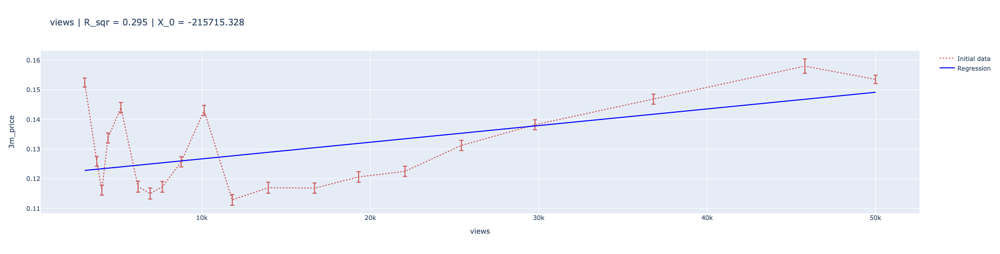

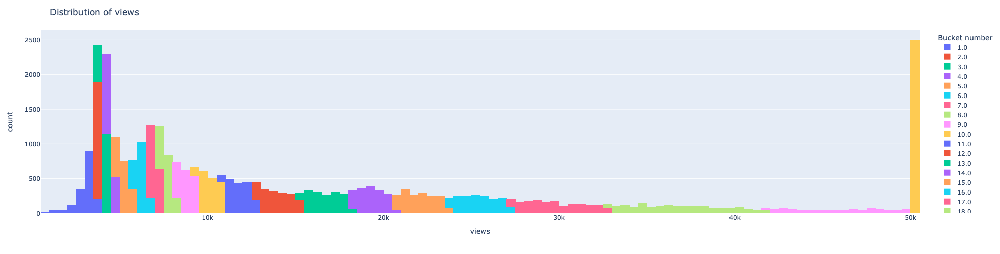

In [21]:
pl.bucket_line(X_train.clip(0, 50000), y, n_buckets=20, feature_name='views', target_name=target, interactive = False)

#### forwards

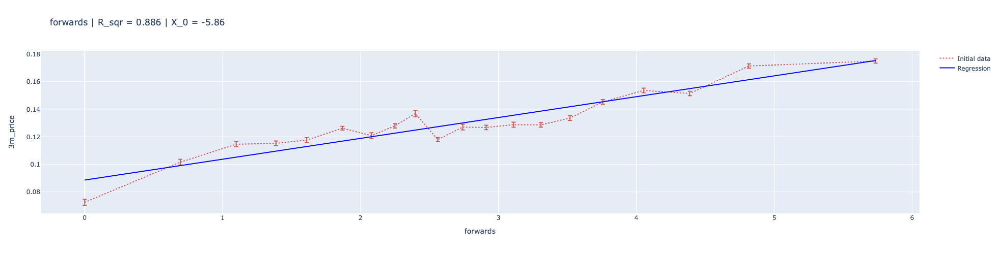

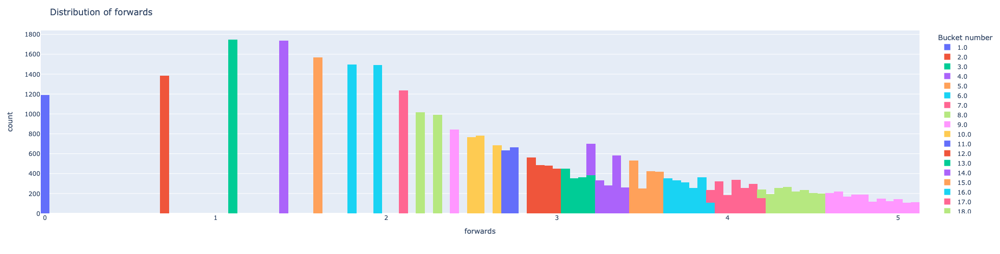

In [22]:
pl.bucket_line(np.log(X_train + 1), y, n_buckets=20, feature_name='forwards', target_name=target, interactive = False)

#### thumb_up_react_cnt

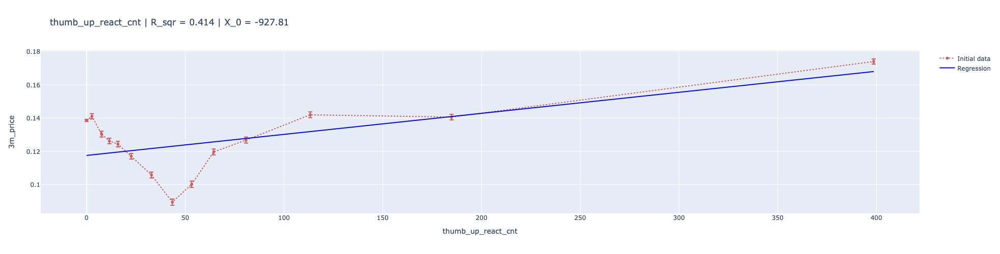

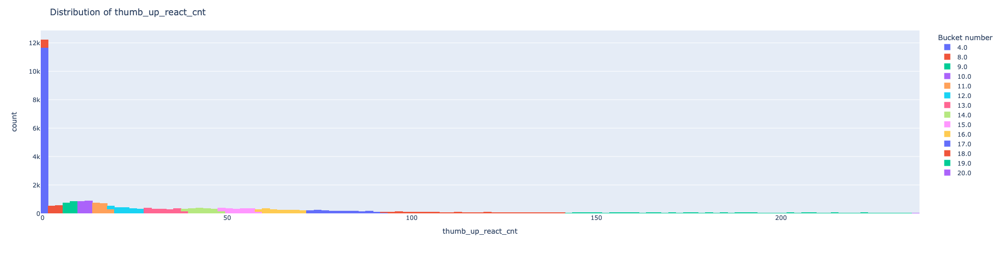

In [52]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='thumb_up_react_cnt', target_name=target, interactive = False)

#### thumb_down_react_cnt

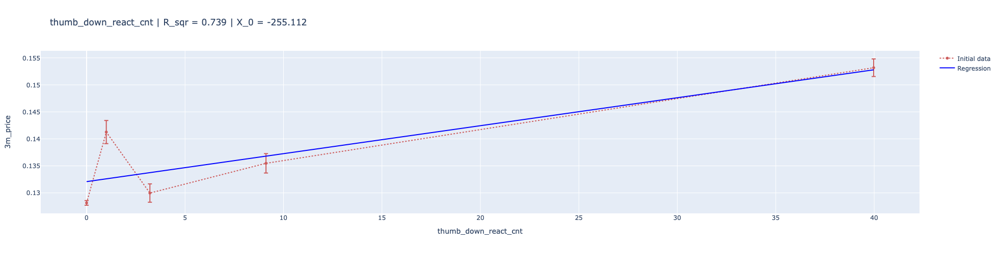

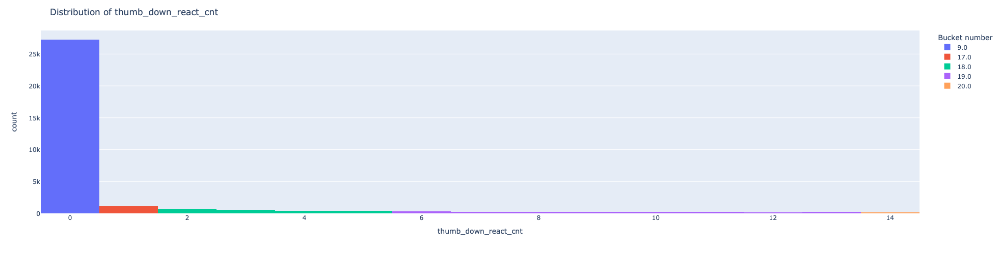

In [53]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='thumb_down_react_cnt', target_name=target, interactive = False)

#### heart_react_cnt

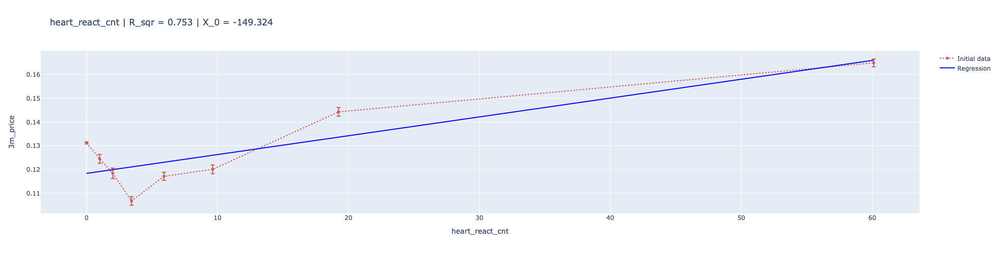

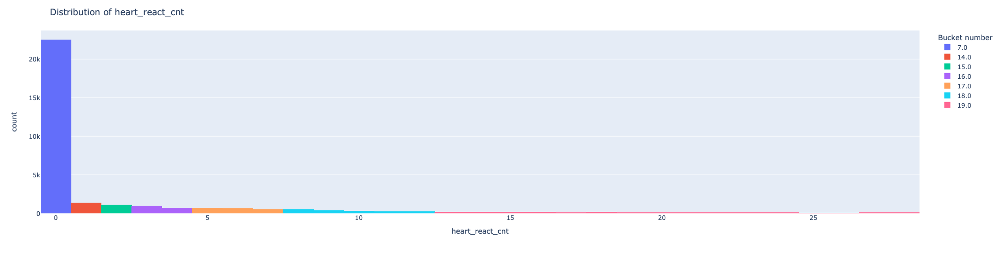

In [25]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='heart_react_cnt', target_name=target, interactive = False)

#### fire_react_cnt

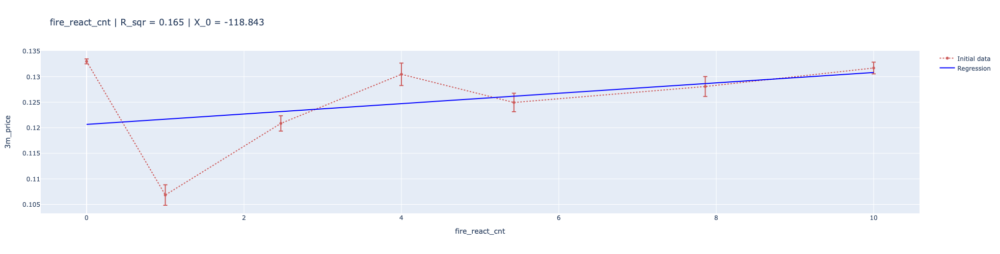

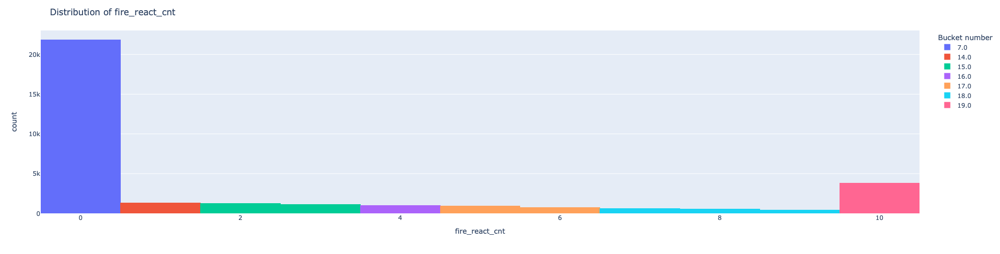

In [26]:
pl.bucket_line(X_train.clip(0, 10), y, n_buckets=20, feature_name='fire_react_cnt', target_name=target, interactive = False)

#### days_before_ipo

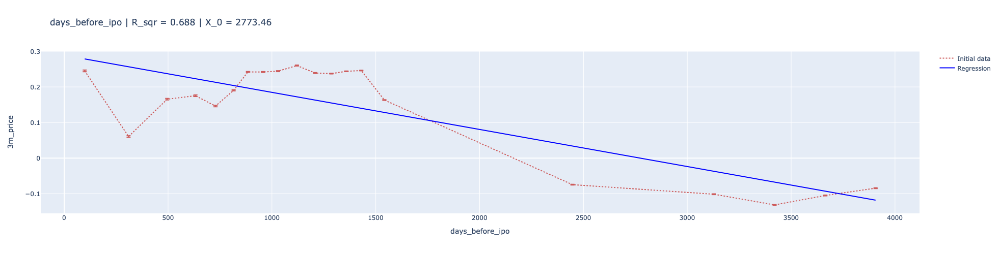

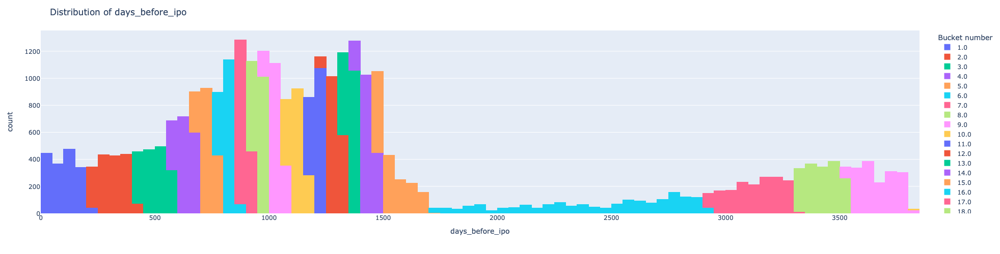

In [27]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='days_before_ipo', target_name=target, interactive = False)

#### text_len

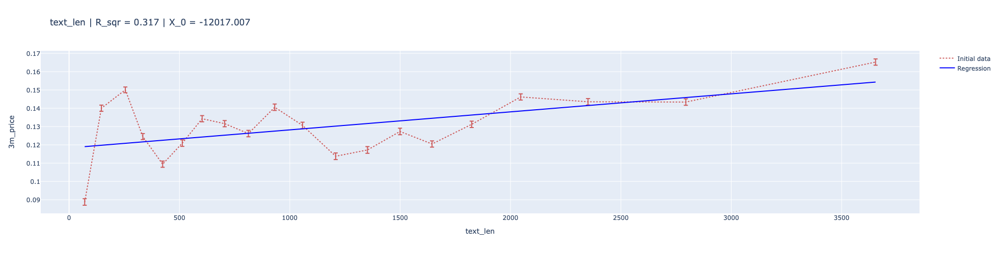

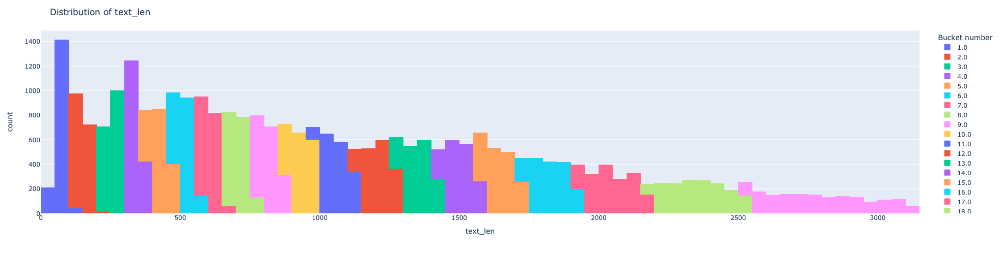

In [28]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='text_len', target_name=target, interactive = False)

#### price

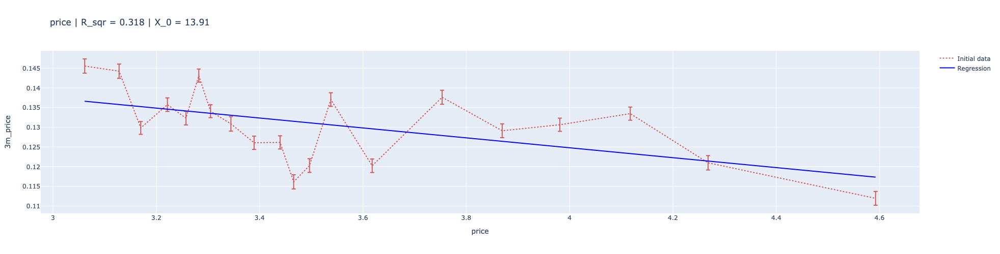

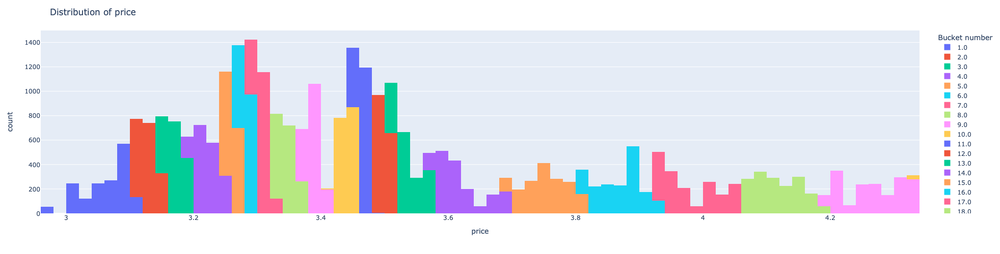

In [29]:
pl.bucket_line(np.log(X_train+1), y, n_buckets=20, feature_name='price', target_name=target, interactive = False)

#### delta_perc

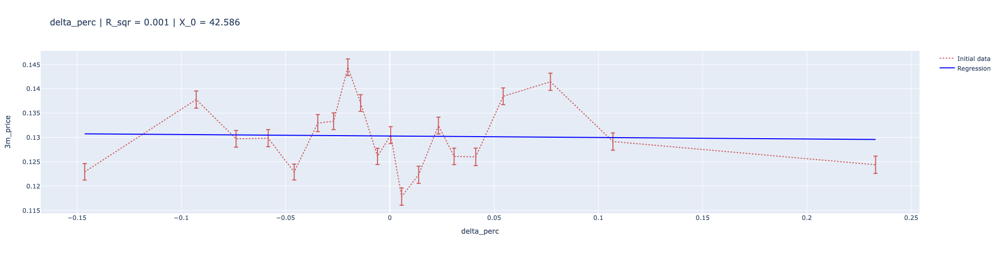

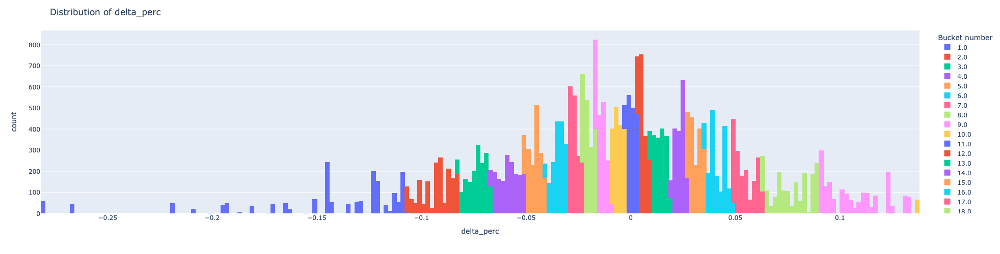

In [30]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='delta_perc', target_name=target, interactive = False)

#### delta_open

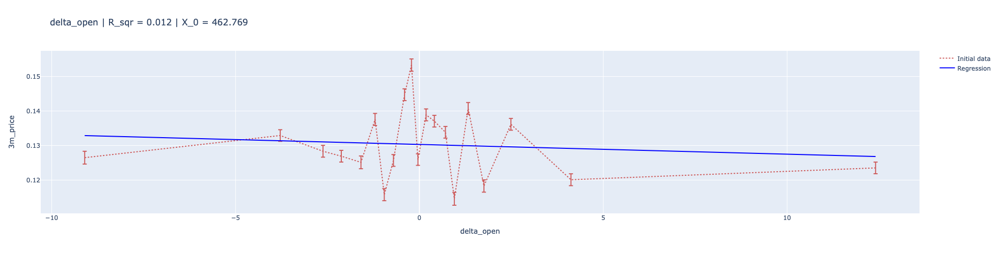

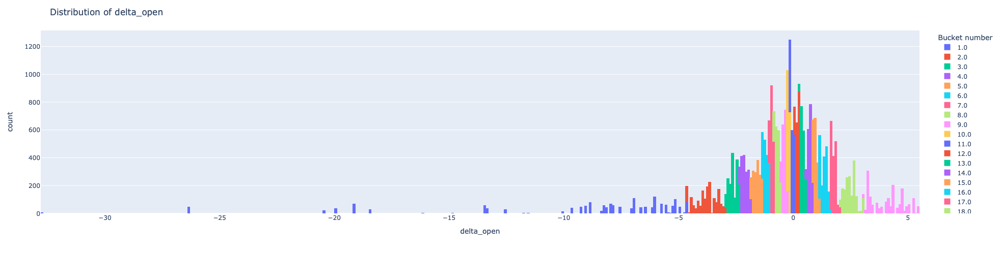

In [31]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='delta_open', target_name=target, interactive = False)

#### positive_score

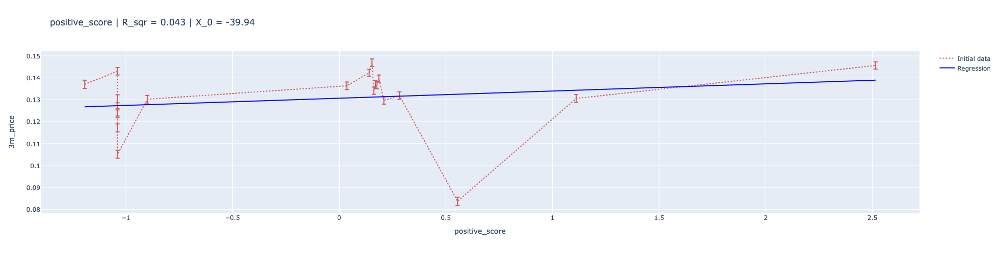

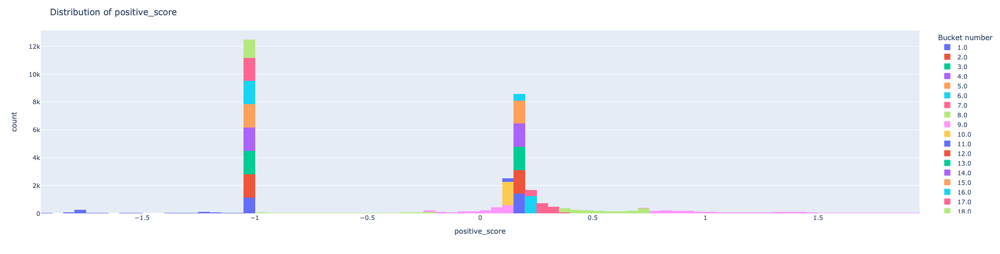

In [32]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='positive_score', target_name=target, interactive = False)

#### text_len_div_by_days

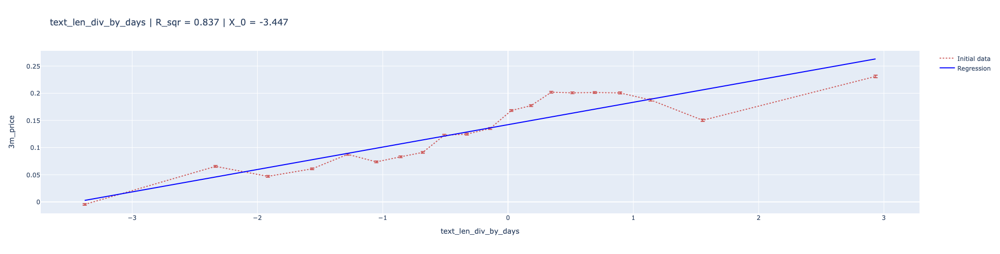

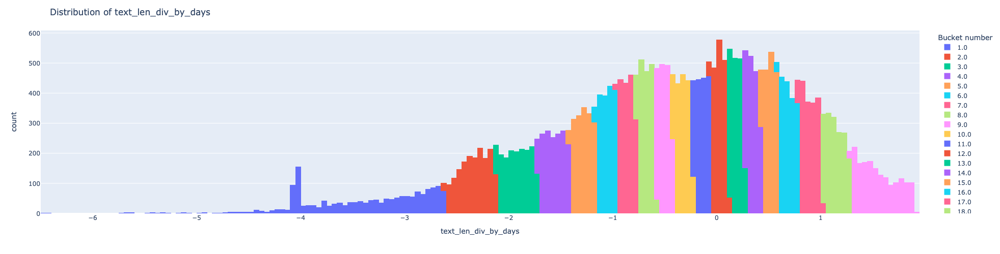

In [36]:
pl.bucket_line(np.log(X_train), y, n_buckets=20, feature_name='text_len_div_by_days', target_name=target, interactive = False)

#### views_div_by_days

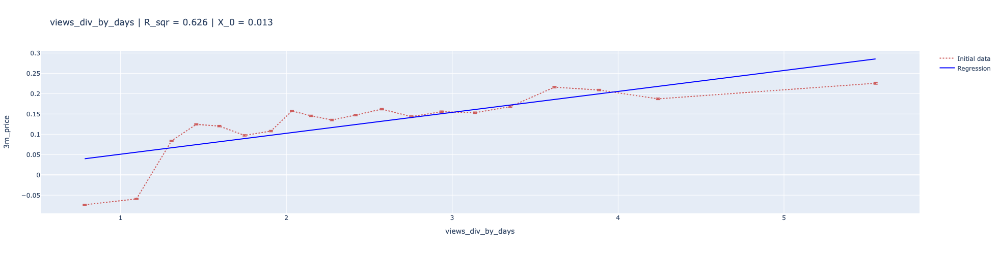

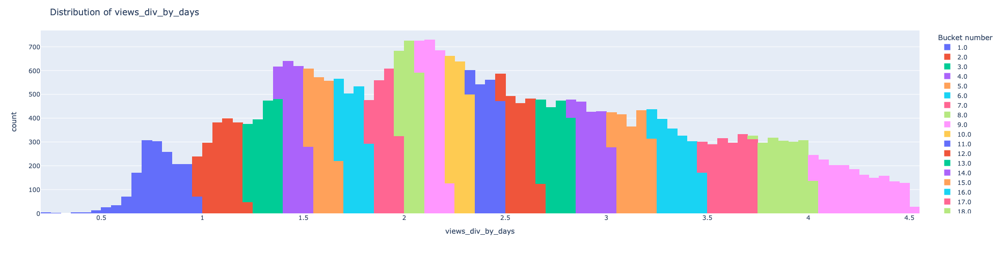

In [37]:
pl.bucket_line(np.log(X_train[['views_div_by_days']]+1), y, n_buckets=20, feature_name='views_div_by_days', target_name=target, interactive = False)

#### text_len_div_by_days

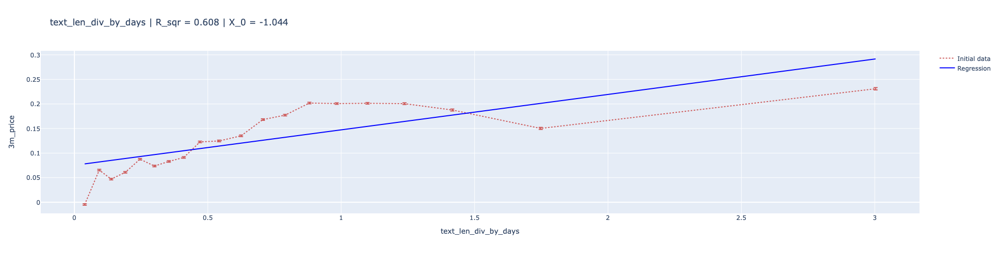

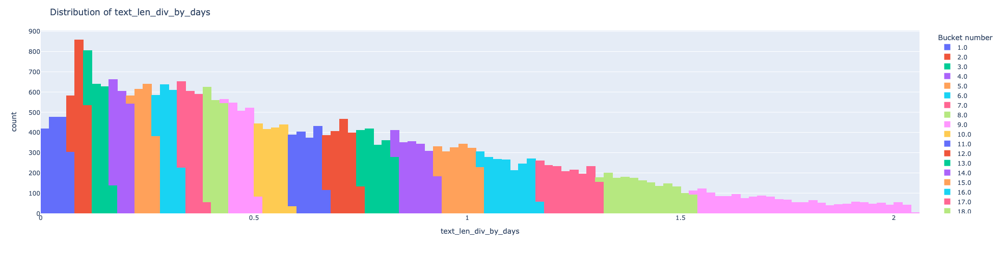

In [38]:
pl.bucket_line(np.log(X_train[['text_len_div_by_days']]+1), y, n_buckets=20, feature_name='text_len_div_by_days', target_name=target, interactive = False)

In [39]:
# train
X_train['views'] = X_train['views'].clip(0, 50000)
X_train['forwards'] = np.log(X_train['forwards']+1)

X_train['thumb_up_react_cnt'] = X_train['thumb_up_react_cnt']
X_train['thumb_down_react_cnt'] = X_train['thumb_down_react_cnt']
X_train['heart_react_cnt'] = X_train['heart_react_cnt']
X_train['fire_react_cnt'] = X_train['fire_react_cnt'].clip(0, 10)
X_train['days_before_ipo'] = X_train['days_before_ipo']

X_train['text_len'] = X_train['text_len']
X_train['price'] = np.log(X_train['price'])
X_train['delta_perc'] = X_train['delta_perc']
X_train['delta_open'] = X_train['delta_open']
X_train['positive_score'] = X_train['positive_score']

X_train['views_div_by_days'] = np.sqrt(X_train['views_div_by_days'])
X_train['text_len_div_by_days'] = np.log(X_train['text_len_div_by_days'])

X_train['views_div_by_days'] = np.log(X_train['views_div_by_days'])
X_train['text_len_div_by_days'] = np.log(X_train['text_len_div_by_days'])


# train
X_test['views'] = X_test['views'].clip(0, 50000)
X_test['forwards'] = np.log(X_test['forwards']+1)

X_test['thumb_down_react_cnt'] = X_test['thumb_down_react_cnt']
X_test['heart_react_cnt'] = X_test['heart_react_cnt']
X_test['fire_react_cnt'] = X_test['fire_react_cnt'].clip(0, 10)
X_test['days_before_ipo'] = X_test['days_before_ipo']

X_test['text_len'] = X_test['text_len']
X_test['price'] = np.log(X_test['price'])
X_test['delta_perc'] = X_test['delta_perc']
X_test['delta_open'] = X_test['delta_open']
X_test['positive_score'] = X_test['positive_score']

X_test['views_div_by_days'] = np.sqrt(X_test['views_div_by_days'])
X_test['text_len_div_by_days'] = np.log(X_test['text_len_div_by_days'])

X_test['views_div_by_days'] = np.log(X_test['views_div_by_days'])
X_test['text_len_div_by_days'] = np.log(X_test['text_len_div_by_days'])

### Hard correlation drop

In [40]:
cols = pl.corr_drop(X[cols], y,  0.5)
print(f'{len(cols)} features remain')

11 features remain


In [41]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [42]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_hard_correlation_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_hard_correlation_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1754,0.3532,0.4300,0.2606
baseline_test,0.1766,0.3404,0.3662,0.2521
after_nonsense_drop_train,0.1759,0.3482,0.4261,0.2606
after_nonsense_drop_test,0.1755,0.3410,0.4111,0.2521
after_soft_correlation_drop_train,0.1761,0.3476,0.4239,0.2606
after_soft_correlation_drop_test,0.1756,0.3392,0.4132,0.2521
after_hard_correlation_drop_train,0.1761,0.3481,0.4231,0.2606
after_hard_correlation_drop_test,0.1756,0.3411,0.4125,0.2521


### Forward selection

In [43]:
train_df = X_train
train_df['target'] = y_train
model = LinearRegression

In [44]:
cols = pl.forward_selection_regression(train_df, cols, model, target='target', alpha_in=0.05)

В модель была добавлена переменная days_before_ipo, p-value: 0.0
В модель была добавлена переменная open, p-value: 0.0
В модель была добавлена переменная thumb_up_react_cnt, p-value: 0.0
В модель была добавлена переменная views, p-value: 0.0
В модель была добавлена переменная smiling_react_cnt, p-value: 0.0
В модель была добавлена переменная thumb_down_react_cnt, p-value: 0.0
В модель была добавлена переменная positive_score, p-value: 0.0


### Итоговые переменные

In [45]:
print(f'total params:{len(cols)}')
cols

total params:7


['days_before_ipo',
 'open',
 'thumb_up_react_cnt',
 'views',
 'smiling_react_cnt',
 'thumb_down_react_cnt',
 'positive_score']

### Model

In [46]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [47]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'model_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'model_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1754,0.3532,0.4300,0.2606
baseline_test,0.1766,0.3404,0.3662,0.2521
after_nonsense_drop_train,0.1759,0.3482,0.4261,0.2606
after_nonsense_drop_test,0.1755,0.3410,0.4111,0.2521
after_soft_correlation_drop_train,0.1761,0.3476,0.4239,0.2606
after_soft_correlation_drop_test,0.1756,0.3392,0.4132,0.2521
after_hard_correlation_drop_train,0.1761,0.3481,0.4231,0.2606
after_hard_correlation_drop_test,0.1756,0.3411,0.4125,0.2521
model_train,0.1761,0.3483,0.4229,0.2606
model_test,0.1756,0.3413,0.4124,0.2521


In [48]:
results.to_csv('results/3m_regression.csv')

In [54]:
import statsmodels.api as sm

model = sm.OLS(y, X[cols])
results = model.fit()
results = results.summary()
results

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:               3m_price   R-squared (uncentered):                   0.190
Model:                            OLS   Adj. R-squared (uncentered):              0.190
Method:                 Least Squares   F-statistic:                              1401.
Date:                Thu, 02 May 2024   Prob (F-statistic):                        0.00
Time:                        00:41:43   Log-Likelihood:                         -5746.7
No. Observations:               41824   AIC:                                  1.151e+04
Df Residuals:                   41817   BIC:                                  1.157e+04
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
days_before_ipo      -4.977e-05   1.02e-06    -48.768      0.000   -5.18e-05   -4.78e-05
open                     0.0035   4.53e-05     77.236      0.000       0.003       0.004
thumb_up_react_cnt       0.0002   1.35e-05     12.217      0.000       0.000       0.000
views                 1.223e-06   5.64e-08     21.678      0.000    1.11e-06    1.33e-06
smiling_react_cnt        0.0003   6.26e-05      5.094      0.000       0.000       0.000
thumb_down_react_cnt    -0.0003   8.86e-05     -3.873      0.000      -0.001      -0.000
positive_score           0.0017      0.001      1.165      0.244      -0.001       0.005
==============================================================================
Omnibus:                     6351.551   Durbin-Watson:                   1.555
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            24184.188
Skew:                          -0.731   Prob(JB):                         0.00
Kurtosis:                       6.427   Cond. No.                     3.48e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.48e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [55]:
import pickle
 
with open("results/3m_regression.pickle", "wb") as file:
    pickle.dump(results, file)